Importing Libraries

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import math
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px


Read & Explore Data

In [3]:
df=pd.read_csv('zomato.csv')
df.head(2) 

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari


In [4]:
df.shape

(51717, 17)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [6]:
df.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

Data Preprocessing

In [7]:
df.drop(columns=['url','reviews_list','menu_item','phone','address'],inplace=True)
df.columns

Index(['name', 'online_order', 'book_table', 'rate', 'votes', 'location',
       'rest_type', 'dish_liked', 'cuisines', 'approx_cost(for two people)',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [8]:
df.drop_duplicates(ignore_index=True,inplace=True)

In [9]:
df['listed_in(type)'].unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

In [10]:
df['rate'].unique()
# NEW,NAN,-

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [77]:
## Cleaning Rate column
#Rate column has this /5 thing therfore need to convert
char_to_remove = ['/5',' /5','NEW','-']
for i in char_to_remove:
    df['rate'] = df['rate'].str.replace(i,'')


AttributeError: Can only use .str accessor with string values!

In [79]:
# Cleared output
df['rate'].head()

0    4.1
1    4.1
2    3.8
3    3.7
4    3.8
Name: rate, dtype: float64

In [80]:
df.head(2)

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet,Banashankari


In [13]:
# Unique Cities
df['listed_in(city)'].unique()

array(['Banashankari', 'Bannerghatta Road', 'Basavanagudi', 'Bellandur',
       'Brigade Road', 'Brookefield', 'BTM', 'Church Street',
       'Electronic City', 'Frazer Town', 'HSR', 'Indiranagar',
       'Jayanagar', 'JP Nagar', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Koramangala 5th Block',
       'Koramangala 6th Block', 'Koramangala 7th Block', 'Lavelle Road',
       'Malleshwaram', 'Marathahalli', 'MG Road', 'New BEL Road',
       'Old Airport Road', 'Rajajinagar', 'Residency Road',
       'Sarjapur Road', 'Whitefield'], dtype=object)

In [14]:
# Null Values in Rate Column
df['rate'].isnull().sum()

7755

In [15]:
# Converting rate column from string to float
df['rate'] = pd.to_numeric(df['rate'], errors='coerce').astype(float)

In [16]:
# Filling NAN values with the mean
df['rate'].fillna(df['rate'].mean(), inplace=True)

In [18]:
# Converting Approx cost of two people to FLOAT
df['approx_cost(for two people)'] = pd.to_numeric(df['approx_cost(for two people)'], errors='coerce').astype(float)

Correlation Matrix

In [19]:
# Correlation between required features
# Pearson Corelation 
co_matrix=df[["approx_cost(for two people)","rate","votes"]].corr()
co_matrix

,approx_cost(for two people),rate,votes
approx_cost(for two people),1.000000,0.156853,0.279831
rate,0.156853,1.000000,0.426892
votes,0.279831,0.426892,1.000000


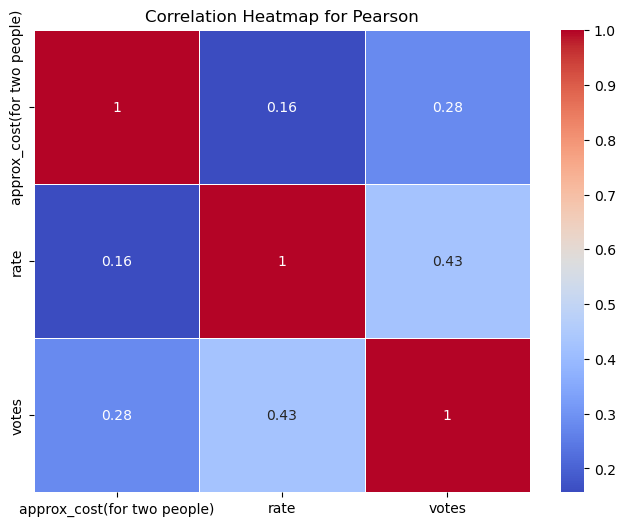

In [20]:
# Heatmap for Pearson

plt.figure(figsize=(8, 6))
sns.heatmap(co_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap for Pearson")
plt.show()

In [85]:
# PLOTLY HEATMAP
fig = px.imshow(co_matrix,x=co_matrix.index,y=co_matrix.columns,labels=dict(color="Pearson Correlation"),
                text_auto=True,color_continuous_scale=px.colors.sequential.Cividis)

fig.update_layout(title="Correlation Heatmap for Pearson",xaxis_title="Features",yaxis_title="Features",
    xaxis_showticklabels=True,yaxis_showticklabels=True,)

fig.show()

In [21]:
#SPEARMEN MATRIX
correlation_matrix = df[["approx_cost(for two people)", "rate", "votes"]].corr(method='spearman')
correlation_matrix

,approx_cost(for two people),rate,votes
approx_cost(for two people),1.000000,0.163614,0.419151
rate,0.163614,1.000000,0.501145
votes,0.419151,0.501145,1.000000


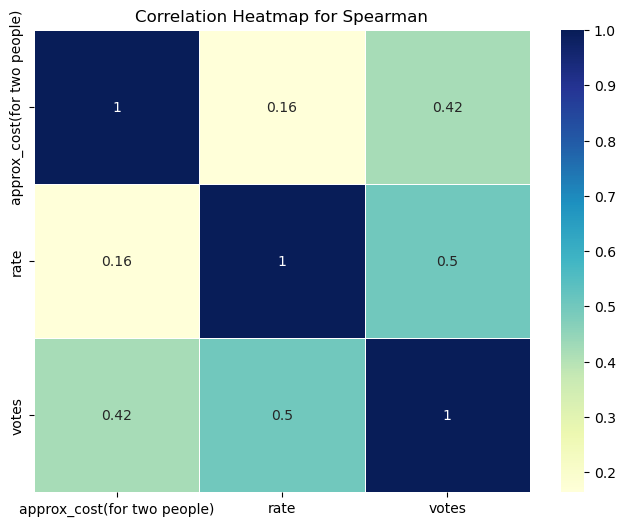

In [22]:
# SPEARMEN CORELATION HEATMAP
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="YlGnBu", linewidths=0.5)
plt.title("Correlation Heatmap for Spearman")
plt.show()

In [23]:
# CHECKING NULL VALUES
df.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                               0
votes                              0
location                          21
rest_type                        227
dish_liked                     28014
cuisines                          45
approx_cost(for two people)     7233
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [86]:
# Checking which locations are Missing
missing_locations = df[df['location'].isna()]
missing_locations.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)


In [25]:
#dropping these 21 values since these cannot be filled as per our Info
df.dropna(subset=['location'], inplace=True)

In [26]:
df.sample(5)

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
12979,Kerala Home Food,No,No,3.700142,0,Brigade Road,Quick Bites,NaN,Kerala,300.0,Dine-out,Church Street
49211,B.M.W - Bhookh Mitaane Wala,Yes,No,3.700000,512,Koramangala 1st Block,Delivery,"Butter Chicken, Pasta, Rolls, Fruit Custard, G...","North Indian, South Indian, Chinese",500.0,Delivery,Sarjapur Road
42651,Khally Wally,No,No,3.700142,0,MG Road,Quick Bites,NaN,"Biryani, Kebab",250.0,Delivery,MG Road
35347,Bubblewrap Waffle Co.,Yes,No,4.400000,362,Jayanagar,Dessert Parlor,"Pizza Waffles, Sandwich, Hot Chocolate, Fries,...","Desserts, Beverages",400.0,Delivery,Koramangala 7th Block
19864,Shaap,Yes,No,3.600000,207,Koramangala 5th Block,Casual Dining,"Appam, Kappa Biryani, Chicken Fry, Kallappam, ...","Kerala, Seafood",500.0,Delivery,Jayanagar


In [27]:
# Analysing Numerical Columns
numeric_columns = df.select_dtypes(include=['number'])
numeric_columns

,rate,votes,approx_cost(for two people)
0,4.100000,775,800.0
1,4.100000,787,800.0
2,3.800000,918,800.0
3,3.700000,88,300.0
4,3.800000,166,600.0
...,...,...,...
51604,3.600000,27,NaN
51605,3.700142,0,600.0
51606,3.700142,0,NaN
51607,4.300000,236,NaN


In [29]:
# Analysing this cost column so as to make inference
fig = px.histogram(df, x="approx_cost(for two people)", nbins=49,labels={'x':'Approximate Cost for Two People', 'y':'count'})
fig.show()

In [30]:
# Since the average is about 300 and next to major value is 400 so considering high end retaurants as well we will be replacing with 400 only
df['approx_cost(for two people)'].fillna(400, inplace=True)

In [32]:
# Checking the changes in the corelation for Pearson
co_matrix_new=df[["approx_cost(for two people)","rate","votes"]].corr()
co_matrix_new
# values have significantly changed 

,approx_cost(for two people),rate,votes
approx_cost(for two people),1.000000,0.123071,0.160913
rate,0.123071,1.000000,0.426903
votes,0.160913,0.426903,1.000000


In [88]:
# Checking the changes in the corelation for Spearmen
correlation_matrix_new=df[["approx_cost(for two people)","rate","votes"]].corr(method='spearman')
correlation_matrix_new
# values have significantly changed 

,approx_cost(for two people),rate,votes
approx_cost(for two people),1.000000,0.175224,0.385091
rate,0.175224,1.000000,0.542930
votes,0.385091,0.542930,1.000000


Text(0.5, 1.0, 'Pearson Correlation Matrix after fillna with 400')

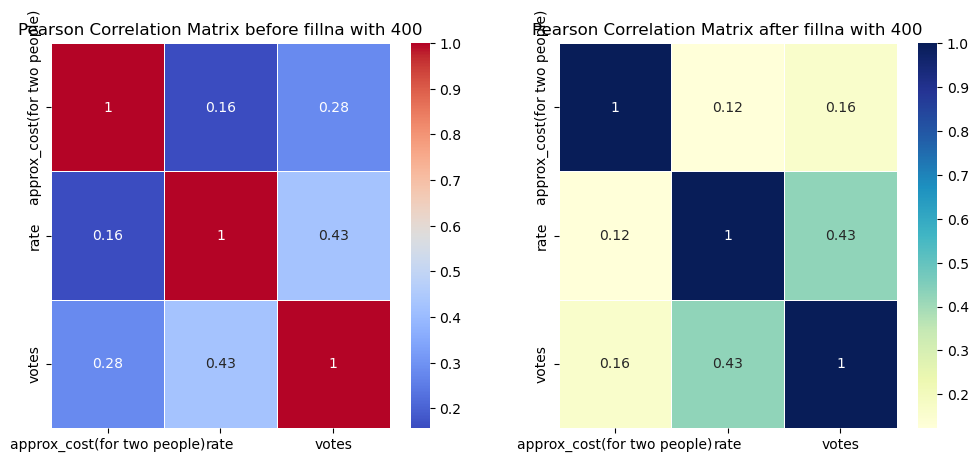

In [99]:
# Heatmap Before and After for Pearson
fig,axes = plt.subplots(1, 2, figsize=(12, 5))
sns.heatmap(co_matrix, annot=True, cmap="coolwarm", linewidths=0.5, ax=axes[0])
axes[0].set_title('Pearson Correlation Matrix before fillna with 400')
sns.heatmap(co_matrix_new, annot=True, cmap="YlGnBu", linewidths=0.5, ax=axes[1])
axes[1].set_title('Pearson Correlation Matrix after fillna with 400')

Text(0.5, 1.0, ' Correlation Matrix after fillna with 400')

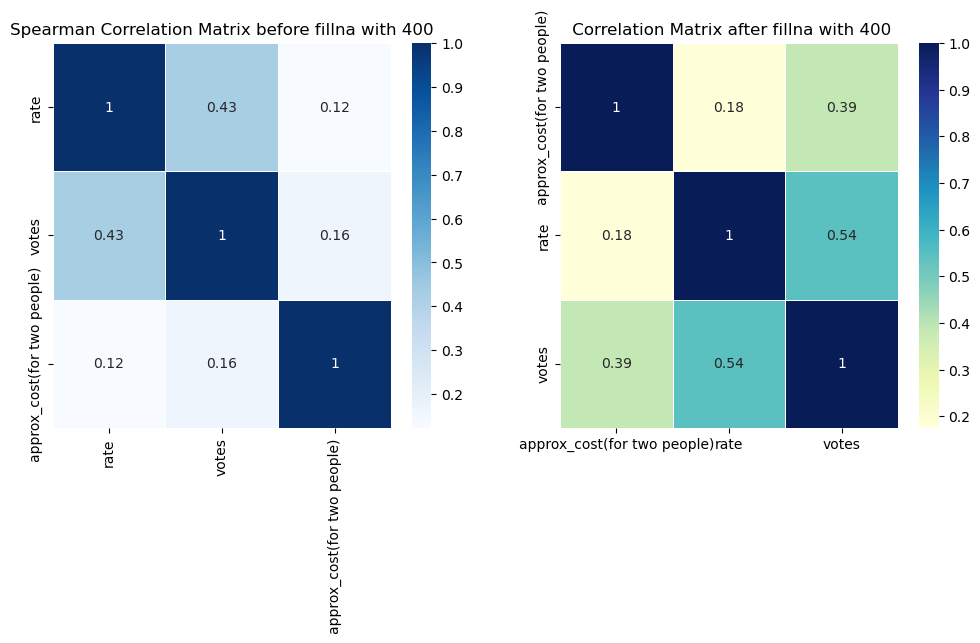

In [98]:
# Heatmap Before and After for Spearman
fig,axes = plt.subplots(1, 2, figsize=(12, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="Blues", linewidths=0.5, ax=axes[0])
axes[0].set_title('Spearman Correlation Matrix before fillna with 400')
sns.heatmap(correlation_matrix_new, annot=True, cmap="YlGnBu", linewidths=0.5, ax=axes[1])
axes[1].set_title(' Correlation Matrix after fillna with 400')

In [100]:
#booking table rating

table_booking_rating_avg = df[df['book_table'] == 'Yes']['rate'].mean()
table_booking_rating_avg = round(table_booking_rating_avg,2)
print('Rating of Table Booking Orders is =',float(table_booking_rating_avg),'\n')

Rating of Table Booking Orders is = 4.13 



How many restaurants delivers online food?

In [34]:
# DO THESE REST DELIEVERS ONLINE
x=df["online_order"].value_counts()
y=x.index
fig=px.pie(values=x,names=y,title="Restaurants delivering Online or not ?",color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(width=600, height=400)
fig.show()

In [35]:
# Dine In VS Online Booking
##CHECK ONLY # TEXTUAL
table_booking_yes = df[df['online_order'] == 'Yes']
table_booking_yes

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet,Banashankari
5,Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600.0,Buffet,Banashankari
7,Onesta,Yes,Yes,4.6,2556,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600.0,Cafes,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...
51589,Shizusan Shophouse & Bar,Yes,Yes,4.4,1313,Whitefield,"Casual Dining, Bar","California Roll, Cocktails, Mocktails, Maki Ro...","Asian, Japanese, Vietnamese, Korean, Chinese, ...",400.0,Pubs and bars,Whitefield
51591,Harry's Bar + Cafe,Yes,Yes,4.1,1218,Whitefield,Pub,"Cocktails, Beer, Long Island Iced Tea, Pasta, ...","Asian, American, Mexican",400.0,Pubs and bars,Whitefield
51593,The Beer Cafe,Yes,Yes,4.1,673,Whitefield,Pub,"Cocktails, Wheat Beer, Bruschettas, Pasta, Bur...","Finger Food, North Indian, Chinese, Italian",400.0,Pubs and bars,Whitefield
51595,Oliver's Pub & Diner,Yes,Yes,3.9,548,Whitefield,"Pub, Casual Dining","Pizza, Beer, Cocktails, Nachos, Pasta, Moo Bur...","Finger Food, American, Continental, Burger, Pizza",400.0,Pubs and bars,Whitefield


How many Restaurants provide online Table booking facility?

In [36]:
# ONLINE TABLE BOOKINGS
x=df["book_table"].value_counts()
y=x.index
fig=px.pie(values=x,names=y,title="Online Table Booking Facility ?",color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_layout(width=600, height=400)
fig.show()

Rating Graph

In [101]:
fig = px.histogram(df, x='rate', title='Rating graph',nbins=70)
#fig.update_traces(width=0.1)
#fig.update_traces(width=40)
fig.show()

Top 10 most preferred locations

In [38]:
# Most Preffered Locations
x=df["location"].value_counts()[:10].sort_values()
y=x.index
fig=px.bar(x=x,y=y,labels={"y":"Top 10 Locations","x":"Count"},title="Most Preferred Locations")
fig.show()

Preferred Restaurant services

In [39]:
# Which Type of Restaurant is being preffered 
y=df["rest_type"].value_counts()[:10]
x=y.index
fig=px.bar(x=x,y=y,labels={"x":"Restaurant Service Types","y":"Count"},title="Restaurant Service")
fig.show()

Top 10 most famous Cuisines

In [40]:
# What type of cuisine is being preffered 
x=df["cuisines"].value_counts()[:10].sort_values()
y=x.index
fig=px.bar(x=x,y=y,labels={"y":"Cuisines","x":"Count"},title="Most Preffered Cuisines")
fig.show()

Scatter plot for Rating's relation with other parameters

In [41]:
# Relation between location and rating 

fig=px.scatter(df,x='location',y='rate',hover_data=['votes'],color='rate')
fig.show()

In [42]:
fig=px.scatter(df,x='listed_in(city)',y='rate',hover_data=['votes'],color='rate',color_continuous_scale=px.colors.sequential.Viridis)
fig.show()

Pairplot for analysing the realtion between variables

In [107]:
# Pair plot
fig = px.scatter_matrix(df,dimensions=['rate', 'votes', 'approx_cost(for two people)'],color='rate') # Optional: color points by a specific variable)
fig.update_traces(marker=dict(size=4))  # Adjust marker size
fig.update_layout(
    title="Pair Plot",
    width=900, height=900,  # Adjust the plot size
    showlegend=False  # Only display the lower half to avoid redundancy
)

# Show the pair plot
fig.show()



<Axes: xlabel='rate', ylabel='Density'>

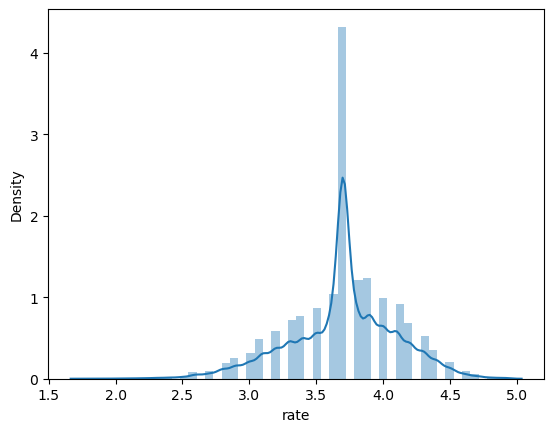

In [43]:
sns.distplot(df['rate'])

Restaurants by rating and their offered services

In [71]:
#RESTUARANTS BY RATING AND THEIR SERVICE TYPE
cross_tab = pd.crosstab(df['rate'], df['listed_in(type)'])
cross_tab = cross_tab.reset_index()
fig = px.bar(cross_tab, x='rate', y=cross_tab.columns[1:], title='Restaurant Types by Rating',color_continuous_scale = 'Bluered_r',template='plotly_dark')
plt.savefig('fig1.png',bbox_inches="tight",dpi=600)
fig.show()

<Figure size 640x480 with 0 Axes>

In [46]:
# DONE TO GET THE GRAPH
# Group the DataFrame by 'rate' and 'listed_in(type)'
df['rate'] = df['rate'].round(3)
grouped = df.groupby(['rate', 'listed_in(type)']).size().unstack()

# Display the resulting DataFrame
print(grouped)

listed_in(type)  Buffet  Cafes  Delivery  Desserts  Dine-out  \
rate                                                           
1.8                 NaN    NaN       NaN       NaN       5.0   
2.0                 NaN    NaN       1.0       NaN       6.0   
2.1                 NaN    NaN      16.0       NaN       8.0   
2.2                 NaN    NaN      11.0       NaN      15.0   
2.3                 5.0    1.0      22.0       NaN      23.0   
2.4                 NaN    2.0      33.0       1.0      30.0   
2.5                 1.0    2.0      54.0       1.0      41.0   
2.6                 3.0   10.0     146.0       5.0      90.0   
2.7                 4.0    9.0     138.0       9.0     138.0   
2.8                16.0   18.0     309.0      18.0     234.0   
2.9                 8.0   28.0     412.0      57.0     284.0   
3.0                21.0   19.0     572.0      27.0     356.0   
3.1                13.0   23.0     881.0      54.0     576.0   
3.2                 2.0   41.0    1009.0

Approximate cost for two people

In [47]:
# TEXTUAL DATA
df['approx_cost(for two people)'].value_counts()

400.0    13760
300.0     7558
500.0     4972
200.0     4842
600.0     3710
250.0     2956
800.0     2283
150.0     2063
700.0     1941
350.0     1762
450.0     1417
100.0      993
650.0      776
550.0      760
750.0      757
900.0      699
850.0      166
950.0       62
120.0       24
180.0       20
80.0        10
230.0       10
130.0        8
50.0         8
40.0         8
330.0        4
199.0        4
70.0         3
190.0        2
240.0        2
360.0        2
140.0        2
160.0        1
469.0        1
60.0         1
560.0        1
Name: approx_cost(for two people), dtype: int64

In [48]:
# Average Cost for Two Persons {Graph}
y=df["approx_cost(for two people)"].value_counts()
x=y.index
fig=px.bar(x=x,y=y,labels={"x":"Cost","y":"Count"},title="Average Cost of Two Persons")
fig.update_traces(width=40)
fig.show()

Box Plot for checking various measures 

In [49]:
# Average cost for two people
fig=px.box(df,y="approx_cost(for two people)",title="Approx cost for two people",template="plotly_dark")
fig.show()

In [66]:
# BOX PLOT FOR VOTES COLUMN
fig=px.box(df,y="votes",title="VOTING",template="plotly_dark")
fig.show()

In [70]:
# BOX PLOT FOR RATING COLUMN
fig=px.box(df,y="rate",title="RATING",template="plotly_dark")
fig.show()

Rating Distribution by Restaurant Type

In [50]:
# RATINGS BY DIFFERENT RESTAURANTS TYPE IN DIFFERENT CURVES
fig = px.histogram(df, x='rate',facet_col='listed_in(type)',facet_col_wrap=3,title='Rating Distribution by Restaurant Type', nbins=100, width=1300,height=800)

fig.show()

In [51]:
# CHECKING THE RATING LOCATION WISE FOR ALL LOCATIONS

fig = px.histogram(df, x='rate',facet_col='listed_in(city)',facet_col_wrap=10,title='Rating Distribution by Location', nbins=100, width=2000,height=800)

fig.show()

In [52]:
# CHECKING THE RATINGS LOCATION WISE FOR TOP 10 CITIES
top_10_cities = df['listed_in(city)'].value_counts().head(10).index.tolist()
df_top_10 = df[df['listed_in(city)'].isin(top_10_cities)]

# HISTOGRAM
fig = px.histogram(
    df_top_10,
    x='rate',
    facet_col='listed_in(city)',
    facet_col_wrap=5, 
    title='Rating Distribution by Location (Top 10 Cities)',
    nbins=100,
    width=1400,
    height=800
)

fig.show()

Top 10 Restaurants Chain Name

In [53]:
# FOR GETTING TOP 10 Restaurants CHAIN {NAMES}
top_10_names = df['name'].value_counts()[:10]
top_10_names

Cafe Coffee Day      96
Onesta               85
Just Bake            73
Empire Restaurant    71
Five Star Chicken    70
Kanti Sweets         68
Petoo                66
Polar Bear           65
Baskin Robbins       64
Chef Baker's         62
Name: name, dtype: int64

In [54]:
# HISTOGRAM FOR TOP 10 RESTAURANT Chain{CURVE}
x=top_10_names
y=top_10_names.index
fig=px.bar(df,x=x,y=y,labels={"y":"Restaurant Name","x":"Count"},title="Top 10 Restaurants Chain",template='plotly_dark')
fig.show()

Most Common Restaurants,their Ratings and Votes

In [63]:
# MOST COMMON RESTAURANTS RATINGS
rests=df["name"].value_counts()[:10].sort_values()
rests_list=rests.index
rest_df=df[df["name"].isin(rests_list)]

rest_df_groupped=rest_df.groupby(by="name")["rate"].mean().sort_values()

labels={"x":"Rates","y":"Restaurant Names"}
fig=px.bar(x=rest_df_groupped.values,
           y=rest_df_groupped.index,
           color=rest_df_groupped.index,
           labels=labels,
           text_auto=True,
           title="Most Common 10 Restaurants' Rating")
           
           
fig.update_layout(showlegend=False)
fig.show()

In [64]:
# MOST COMMON RESTAURANTS VOTES
rests=df["name"].value_counts()[:10].sort_values()
rests_list=rests.index
rest_df=df[df["name"].isin(rests_list)]

rest_df_groupped=rest_df.groupby(by="name")["votes"].mean().sort_values()

labels={"x":"Votes","y":"Restaurant Names"}
fig=px.bar(x=rest_df_groupped.values,
           y=rest_df_groupped.index,
           color=rest_df_groupped.index,
           labels=labels,
           text_auto=True,
           title="Most Common 10 Restaurants' Votes")
           
           
fig.update_layout(showlegend=False)
fig.show()

Top 10 Expensive Restaurants

In [55]:
# Top 10 most expensive restaurants {TEXT}
top_10_exp = df.sort_values(by='approx_cost(for two people)',ascending=False).head(5)
top_10_exp

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
12480,Ayda Persian Kitchen,Yes,No,3.9,224,Church Street,Casual Dining,"Roti, Naan, Butter Chicken, Biryani, Saffron R...","North Indian, Iranian",950.0,Dine-out,Church Street
16798,Caffe Pascucci,Yes,Yes,4.1,720,HSR,Cafe,"Pizza, Coffee, Pasta, Sandwiches, Chicken Lasa...","Cafe, Continental, Pizza, Italian, Beverages",950.0,Desserts,HSR
3027,1947,No,Yes,4.1,2303,Jayanagar,Casual Dining,"Palak Paneer, Aam Panna, Crispy Corn, Gajar Ka...","North Indian, Chinese",950.0,Delivery,Basavanagudi
48575,Engine,No,No,3.3,16,Ulsoor,"Casual Dining, Bar",NaN,"Biryani, South Indian, North Indian, Chinese, ...",950.0,Dine-out,Residency Road
19315,Engine,No,No,3.3,16,Ulsoor,"Casual Dining, Bar",NaN,"Biryani, South Indian, North Indian, Chinese, ...",950.0,Pubs and bars,Indiranagar


In [56]:
# To check the Lower and Upper range
df['approx_cost(for two people)'].unique()

array([800., 300., 600., 700., 550., 500., 450., 650., 400., 900., 200.,
       750., 150., 850., 100., 350., 250., 950., 199.,  80., 160., 230.,
       130.,  50., 190., 180., 330.,  40., 120., 469.,  70.,  60., 560.,
       240., 360., 140.])

In [57]:
# TOP 10 Restaurants by avg cost

avg_cost = df.groupby('name')[['approx_cost(for two people)','rate']].mean().reset_index()
top_10_avg_cost = avg_cost.nlargest(10, 'approx_cost(for two people)')


In [58]:
# CURVE FOR Top 10 expensive restaurants
fig = px.bar( top_10_avg_cost,x='approx_cost(for two people)',y='name',
    labels={'name': 'Restaurant Name', 'approx_cost(for two people)': 'Average Cost'},
    title='Average Cost for Two People - Top 10 Restaurants and their Ratings',color='rate',color_continuous_scale='viridis_r')

fig.show()

In [59]:
top_20_exp = df.groupby('name', sort=False)['approx_cost(for two people)'].mean().nlargest(20)

fig = px.bar(
    x=top_20_exp.index,  # Restaurant names
    y=top_20_exp,  # Average cost values
    labels={'x': 'Restaurant Name', 'y': 'Average Cost'},
    title='Top 20 Restaurants by their Average Cost',template='ggplot2'
)
fig.show()

Top 10 Locations having most number of restaurants

In [60]:
# No. of restaurants in Top 10 l0cations {NAME}
df4=df['location'].value_counts()[:10]
df4

BTM                      5109
HSR                      2521
Koramangala 5th Block    2502
JP Nagar                 2234
Whitefield               2140
Indiranagar              2075
Jayanagar                1926
Marathahalli             1843
Bannerghatta Road        1628
Bellandur                1283
Name: location, dtype: int64

In [61]:
#No. of restaurants in Top 10 l0cations {CURVE}
fig=px.bar(df4,title="No. of Restaurants in top 10 Locations")
fig.update_layout(xaxis_title='Restaurant Name', yaxis_title='Count')
plt.savefig('fig4.png',bbox_inches="tight",dpi=600)
fig.show()


<Figure size 640x480 with 0 Axes>

Most Liked Dish

In [62]:
# MOST LIKED DISH
x=df["dish_liked"].value_counts()[:10].sort_values()
fig=px.bar(x=x,
           y=x.index,
           labels={"y":"Most Liked Dish","x":"Number of Dish Liked"},
           title="Most Preferred Dishes",
           color=x.index)
fig.show()

Top 10 Highest Voted Restaurants

In [108]:
# TOP 10 HIGHEST VOTED RESTAURANTS
mean_ratings = df.groupby('name')['votes'].mean().reset_index()

top_rated_restaurants = mean_ratings.nlargest(10, 'votes')


fig = px.bar(top_rated_restaurants,x='votes',y='name',title='Top 10 Highest Voted Restaurants',labels={'name': 'Restaurant Name', 'rating': 'Mean Votes'},color='name',text_auto=True)

fig.show()

Correlation and Feature Selection

In [76]:
correlation_matrix = df.corr()

# Select the columns with high correlation (you can set your own threshold)
highly_correlated_columns = correlation_matrix[abs(correlation_matrix) > 0.4].stack().reset_index()
highly_correlated_columns = highly_correlated_columns[highly_correlated_columns['level_0'] != highly_correlated_columns['level_1']]

# List the highly correlated columns
selected_columns = list(set(highly_correlated_columns['level_0']).union(set(highly_correlated_columns['level_1'])))

# Select the features (columns) you want to keep
selected_features = df[selected_columns]

# Print the selected features
print(selected_features)



       rate  votes
0       4.1    775
1       4.1    787
2       3.8    918
3       3.7     88
4       3.8    166
...     ...    ...
51604   3.6     27
51605   3.7      0
51606   3.7      0
51607   4.3    236
51608   3.4     13

[51588 rows x 2 columns]
